# "Machine Learning Pipeline for Automated Detection of ICMEs "

The work package "Machine Learning Solutions for Data Analysis and Exploitation in Planetary Science" within Europlanet 2024 Research Infrastructure will develop machine learning (ML) powered data analysis and exploitation tools optimized for planetary science. <br>
In this workshop, we will introduce a ML pipeline for the automated detection of interplanetary coronal mass ejections (ICMEs) in solar wind time series data. First, we will briefly give an overview about the physical problem and its relevance for space weather. Then, we will guide the participants through the developed ML code with the help of a sample data set of solar wind time series data from different spacecraft. At the end, we will also cover problems encountered during the development of the pipeline. <br>

Europlanet 2024 RI has received funding from the European Union’s Horizon 2020 research and innovation programme under grant agreement No 871149. <br><br>

In the following, we propose a method for this use case, which was originally used for medical image segmentation. The model architecture was derived from the original [ResUNetPlusPlus](https://arxiv.org/pdf/1911.07067.pdf). However, the dimensions were slightly adapted in order to deal with time series instead of images. <br> <br>

The next step is to further enhance the performance and include CIRs into the range of detectable phenomena. 

## Installation Guide

This pipeline runs on Python 3.6 <br> <br>

git clone https://github.com/epn-ml/EPSC2021-ICME-workshop.git  <br>
python -m venv wsenv <br>
source wsenv/bin/activate <br>
cd EPSC2021-ICME-workshop <br>
pip install -r requirements.txt <br>
ipython kernel install --user --name=wsenv <br>
jupyter lab <br> <br>

In [1]:
# at first, we want to import the necessary packages

# Don't print warnings
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
from glob import glob
import datetime
import pickle
import matplotlib.pyplot as plt
import pandas as pds 

import tensorflow as tf
from tensorflow.keras.metrics import Precision, Recall, MeanIoU
from tensorflow.keras.optimizers import Adam, Nadam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import CustomObjectScope
from sklearn.preprocessing import StandardScaler


from data_generator import DataGen
from m_resunet import ResUnetPlusPlus
from metrics import dice_coef, dice_loss
import postProcess
import event as evt
import windows as wdw

The complete dataset can be downloaded [here](https://figshare.com/articles/dataset/Solar_wind_in_situ_data_suitable_for_machine_learning_python_numpy_arrays_STEREO-A_B_Wind_Parker_Solar_Probe_Ulysses_Venus_Express_MESSENGER/12058065)! <br> 

For demonstration of the pipeline, we only use a subset of the original data!

In [2]:
# load event catalogs and datasets

evtListw, evtLista, evtListb = postProcess.get_catevents()

#load WIND Test Data
X_testw = pds.read_csv('data/X_testw.csv', index_col = 'Unnamed: 0')
X_testw.index = pds.to_datetime(X_testw.index)

Y_testw = pds.read_csv('data/Y_testw.csv', index_col = 'Unnamed: 0')
Y_testw.index = pds.to_datetime(Y_testw.index)

#load STEREO A Test Data
X_testa = pds.read_csv('data/X_testa.csv', index_col = 'Unnamed: 0')
X_testa.index = pds.to_datetime(X_testa.index)

Y_testa = pds.read_csv('data/Y_testa.csv', index_col = 'Unnamed: 0')
Y_testa.index = pds.to_datetime(Y_testa.index)

#load STEREO B Test Data
X_testb = pds.read_csv('data/X_testb.csv', index_col = 'Unnamed: 0')
X_testb.index = pds.to_datetime(X_testb.index)

Y_testb = pds.read_csv('data/Y_testb.csv', index_col = 'Unnamed: 0')
Y_testb.index = pds.to_datetime(Y_testb.index)

# delete empty events

evtListw = evt.clearempties(evtListw,X_testw)
evtLista = evt.clearempties(evtLista,X_testa)
evtListb = evt.clearempties(evtListb,X_testb)

In [7]:
X_testw

,bx,by,bz,bt,vt,np,tp,beta,Pdyn,texrat
2019-01-01 00:10:00,1.109115,-2.962263,-3.277183,4.709420,456.060793,4.429073,84681.005398,0.587935,1.541156e-09,1.036575
2019-01-01 00:20:00,0.285801,-3.186163,-2.983477,4.498028,457.725475,4.256225,76140.751988,0.562704,1.490468e-09,0.922902
2019-01-01 00:30:00,-0.810931,-3.906591,-2.103964,4.521386,456.247099,4.367913,71406.614661,0.535502,1.520568e-09,0.873942
2019-01-01 00:40:00,-1.108803,-4.545990,-1.687808,4.993792,459.025377,3.991991,65720.619440,0.368371,1.407031e-09,0.788000
2019-01-01 00:50:00,-2.334728,-4.458465,-1.066525,5.184712,465.442104,3.582142,68444.734556,0.319537,1.298043e-09,0.786859
...,...,...,...,...,...,...,...,...,...,...
2019-12-31 23:10:00,-1.811237,1.310585,0.197953,2.255295,292.919808,11.623985,15994.228777,1.285101,1.668197e-09,1.009619
2019-12-31 23:20:00,-1.741854,1.160531,-0.076092,2.108522,294.834293,11.134810,17797.379863,1.553686,1.618479e-09,1.088439
2019-12-31 23:30:00,-2.188005,-0.381279,0.633780,2.329985,298.900272,8.685144,32860.180032,1.835626,1.297923e-09,1.893862
2019-12-31 23:40:00,-1.620045,-0.345000,1.138127,2.027722,301.751131,9.218641,31590.699685,2.588254,1.404703e-09,1.747721


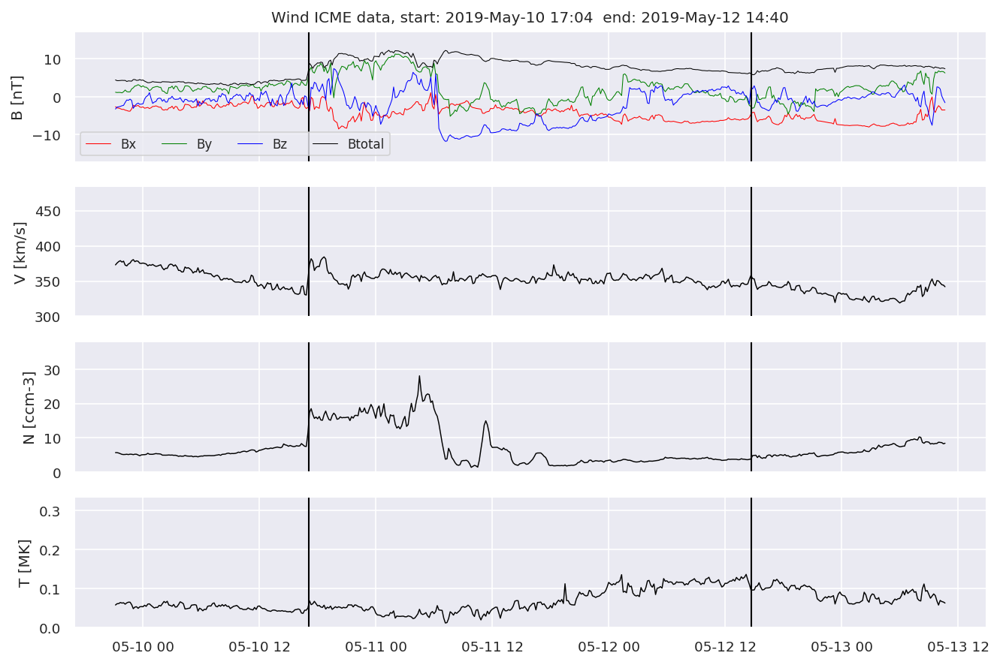

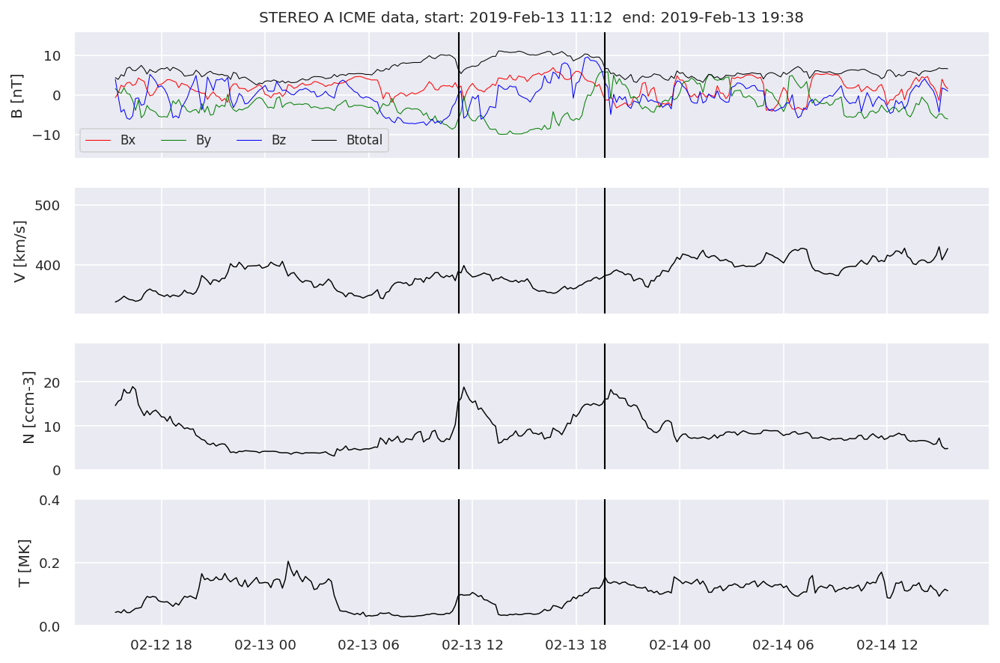

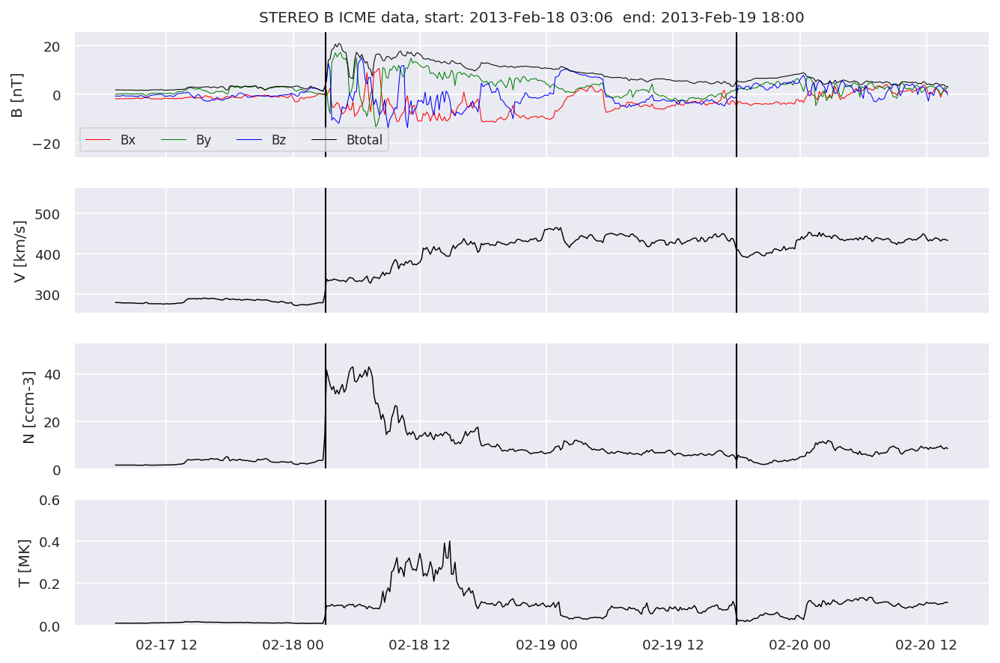

In [8]:
# plot example event for WIND

evtListw[0].iwfplotnopred(X_testw, 20, 'Wind ')

# plot example event for STEREO A

evtLista[1].iwfplotnopred(X_testa, 20, 'STEREO A ')

# plot example event for STEREO B

evtListb[1].iwfplotnopred(X_testb, 20, 'STEREO B ')

In [10]:
# perform scaling

scale = pickle.load(open('scalew.pkl','rb'))
X_testw_scaled = pds.DataFrame(index = X_testw.index, columns = X_testw.columns, data = scale.transform(X_testw))

scale = pickle.load(open('scalea.pkl','rb'))
X_testa_scaled = pds.DataFrame(index = X_testa.index, columns = X_testa.columns, data = scale.transform(X_testa)) 

scale = pickle.load(open('scaleb.pkl','rb'))
X_testb_scaled = pds.DataFrame(index = X_testb.index, columns = X_testb.columns, data = scale.transform(X_testb))

In [11]:
X_testw_scaled

,bx,by,bz,bt,vt,np,tp,beta,Pdyn,texrat
2019-01-01 00:10:00,0.346594,-0.807775,-1.117828,-0.168968,0.398909,-0.388682,-0.021690,-0.077490,-0.126498,-0.037800
2019-01-01 00:20:00,0.090415,-0.868558,-1.016483,-0.248020,0.416156,-0.421831,-0.123958,-0.083762,-0.160435,-0.051880
2019-01-01 00:30:00,-0.250839,-1.064135,-0.713000,-0.239285,0.400839,-0.400411,-0.180648,-0.090524,-0.140282,-0.057944
2019-01-01 00:40:00,-0.343523,-1.237714,-0.569403,-0.062625,0.429623,-0.472507,-0.248736,-0.132072,-0.216297,-0.068589
2019-01-01 00:50:00,-0.724977,-1.213954,-0.355025,0.008772,0.496101,-0.551109,-0.216115,-0.144212,-0.289266,-0.068731
...,...,...,...,...,...,...,...,...,...,...
2019-12-31 23:10:00,-0.562090,0.352190,0.081292,-1.086709,-1.291253,0.991184,-0.844195,0.095822,-0.041442,-0.041139
2019-12-31 23:20:00,-0.540501,0.311454,-0.013269,-1.141596,-1.271419,0.897368,-0.822603,0.162591,-0.074729,-0.031376
2019-12-31 23:30:00,-0.679323,-0.107106,0.231678,-1.058778,-1.229294,0.427562,-0.642230,0.232679,-0.289347,0.068388
2019-12-31 23:40:00,-0.502599,-0.097257,0.405706,-1.171812,-1.199759,0.529878,-0.657432,0.419778,-0.217856,0.050286


In [12]:
t = 1024
window = int(t)


X_testw_windowed = wdw.make_views(X_testw_scaled, win_size = window, step_size = window ,writeable = False)
X_testa_windowed = wdw.make_views(X_testa_scaled, win_size = window, step_size = window ,writeable = False)
X_testb_windowed = wdw.make_views(X_testb_scaled, win_size = window, step_size = window ,writeable = False)


Y_testw_windowed = wdw.make_views(Y_testw, win_size = window, step_size = window ,writeable = False)
Y_testa_windowed = wdw.make_views(Y_testa, win_size = window, step_size = window ,writeable = False)
Y_testb_windowed = wdw.make_views(Y_testb, win_size = window, step_size = window ,writeable = False)

In [13]:
X_testw_windowed

array([[[0.3465940307434671, -0.8077747001207608, -1.1178281073516092,
         ..., -0.12649813964842208, -0.03779976857374923,
         Timestamp('2019-01-01 00:10:00')],
        [0.09041540185104503, -0.8685575016389067, -1.016482841378793,
         ..., -0.16043499964855423, -0.051879810932710234,
         Timestamp('2019-01-01 00:20:00')],
        [-0.25083900268453585, -1.0641345555903152, -0.7130004810808221,
         ..., -0.14028214223356916, -0.05794424440400216,
         Timestamp('2019-01-01 00:30:00')],
        ...,
        [-1.2186059754394802, -0.18120929679826123, 0.41653572948602663,
         ..., -0.08667010585452212, -0.009621266131241212,
         Timestamp('2019-01-08 02:40:00')],
        [-0.4161949747499007, 0.6616187908912881, 0.5990276085550117,
         ..., 0.023384912120074496, -0.02883277485190718,
         Timestamp('2019-01-08 02:50:00')],
        [-1.1324402188880294, 0.24532629612569276, 0.016886185812878197,
         ..., -0.09435480241332639, -0.00554

In [14]:
path = "Testsets/"

#saving windows to folder

name = 'featuresw'
postProcess.savetofolder(path,name, X_testw_windowed)

name = 'labelsw'
postProcess.saveYtofolder(path,name, Y_testw_windowed)

name = 'featuresa'
postProcess.savetofolder(path,name, X_testa_windowed)

name = 'labelsa'
postProcess.saveYtofolder(path,name, Y_testa_windowed)

name = 'featuresb'
postProcess.savetofolder(path,name, X_testb_windowed)

name = 'labelsb'
postProcess.saveYtofolder(path,name, Y_testb_windowed)

In [15]:
model_path = "best_model"

#train_path = "Trainsets/"
#valid_path = "Valsets/"

#### we don't want to train the model right now, so we'll skip some steps####

## Training
#train_image_paths = glob(os.path.join(train_path, "features*"))
#train_mask_paths = glob(os.path.join(train_path, "labels*"))
#train_image_paths.sort()
#train_mask_paths.sort()

## Validation
#valid_image_paths = glob(os.path.join(valid_path, "features*"))
#valid_mask_paths = glob(os.path.join(valid_path, "labels*"))
#valid_image_paths.sort()
#valid_mask_paths.sort()

## Parameters
image_size = (1024,1,10)
#batch_size = 32
#lr = 1e-5
#epochs = 200

#train_steps = len(train_image_paths)//batch_size
#valid_steps = len(valid_image_paths)//batch_size

## Generator
#train_gen = DataGen(image_size, train_image_paths, train_mask_paths, batch_size=batch_size)
#valid_gen = DataGen(image_size, valid_image_paths, valid_mask_paths, batch_size=batch_size)

## ResUnet++
#arch = ResUnetPlusPlus(input_shape=image_size)
#model = arch.build_model()

#optimizer = Adam(lr)
#metrics = [Recall(), Precision(), dice_coef, MeanIoU(num_classes=2)]
#model.compile(loss=dice_loss, optimizer=optimizer, metrics=metrics)

#csv_logger = CSVLogger(f"{file_path}unet_{batch_size}.csv", append=False)
#checkpoint = ModelCheckpoint(model_path, verbose=1, save_best_only=True)
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-8, verbose=1)
#early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
#callbacks = [csv_logger, reduce_lr, checkpoint, early_stopping]

#model.fit_generator(train_gen,
#        validation_data=valid_gen,
#        steps_per_epoch=train_steps,
#        validation_steps=valid_steps,
#        epochs=epochs,
#        callbacks=callbacks)

In [16]:
# instead, we'll load the trained model

with CustomObjectScope({'dice_loss': dice_loss, 'dice_coef': dice_coef}):
        model = load_model(model_path)

#print model architecture

model.summary()

Model: "ResUNetPlusPlus"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 1024, 1, 10) 0                                            
__________________________________________________________________________________________________
conv2d_41 (Conv2D)              (None, 1024, 1, 16)  1456        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_37 (BatchNo (None, 1024, 1, 16)  64          conv2d_41[0][0]                  
__________________________________________________________________________________________________
activation_23 (Activation)      (None, 1024, 1, 16)  0           batch_normalization_37[0][0]     
____________________________________________________________________________________

![Resunet](Resunet++.png)

We need information of WHAT and WHERE!

### U-Net

- Consists of Downsampling, Upsampling and Concatenation
- Downsampling helps understand WHAT is the important information
- Upsampling and Concatenation keeps information of WHERE

### Residual Units

- Deeper = Better?
- vanishing/exploding gradient problem hinders optimization for deep CNNs
- shortcuts allow deeper networks while also reducing the computational cost

### Squeeze and Excitation Units

- improves channel interdependencies at almost no computational cost
- content aware mechanism to weight each channel adaptively

### Atrous Spatial Pyramidal Pooling

-  module for resampling a given feature layer at multiple rates prior to convolution

### Attention Units

- boosts performance and reduces computational cost
- determines which parts of the network require more attention

In [17]:
# evaluation of the model

batch_size = 1

test_path = "Testsets/"

# Test WIND 

test_image_paths = glob(os.path.join(test_path, "featuresw*"))
test_mask_paths = glob(os.path.join(test_path, "labelsw*"))
test_image_paths.sort()
test_mask_paths.sort()


test_steps = len(test_image_paths)//batch_size
test_gen = DataGen(image_size, test_image_paths, test_mask_paths, batch_size=batch_size)
model.evaluate_generator(test_gen, steps=test_steps, verbose=1)

resultw = postProcess.generate_result(test_image_paths, test_mask_paths, model)

# Test STEREO A

test_image_paths = glob(os.path.join(test_path, "featuresa*"))
test_mask_paths = glob(os.path.join(test_path, "labelsa*"))
test_image_paths.sort()
test_mask_paths.sort()


test_steps = len(test_image_paths)//batch_size
test_gen = DataGen(image_size, test_image_paths, test_mask_paths, batch_size=batch_size)
model.evaluate_generator(test_gen, steps=test_steps, verbose=1)

resulta = postProcess.generate_result(test_image_paths, test_mask_paths, model)

# Test STEREO B

test_image_paths = glob(os.path.join(test_path, "featuresb*"))
test_mask_paths = glob(os.path.join(test_path, "labelsb*"))
test_image_paths.sort()
test_mask_paths.sort()

test_steps = len(test_image_paths)//batch_size
test_gen = DataGen(image_size, test_image_paths, test_mask_paths, batch_size=batch_size)
model.evaluate_generator(test_gen, steps=test_steps, verbose=1)

resultb = postProcess.generate_result(test_image_paths, test_mask_paths, model)

Instructions for updating:
Please use Model.evaluate, which supports generators.
51/51 [==============================] - 3s 54ms/step - loss: 0.6485 - recall_1: 0.8637 - precision_1: 0.8188 - dice_coef: 0.3515 - mean_io_u_1: 0.8592


100%|██████████| 51/51 [00:07<00:00,  6.90it/s]


46/46 [==============================] - 2s 50ms/step - loss: 0.7186 - recall_1: 0.3050 - precision_1: 0.4932 - dice_coef: 0.2814 - mean_io_u_1: 0.5820


100%|██████████| 46/46 [00:05<00:00,  8.73it/s]


84/84 [==============================] - 4s 50ms/step - loss: 0.6529 - recall_1: 0.5807 - precision_1: 0.5565 - dice_coef: 0.3471 - mean_io_u_1: 0.6340


100%|██████████| 84/84 [00:09<00:00,  8.81it/s]


#### Precision

percentage of true ICMEs predicted by the algorithm out of all predicted 

- True Positives/(True Positives + False Positives)

#### Recall 

percentage of true ICMEs predicted by the algorithm out of all true

- True Positives/(True Positives + False Negatives)

#### Mean IoU

- True Positives / (True Positives + False Negatives + False Positives)

#### Dice Coefficient

- 2 x Intersection/Union

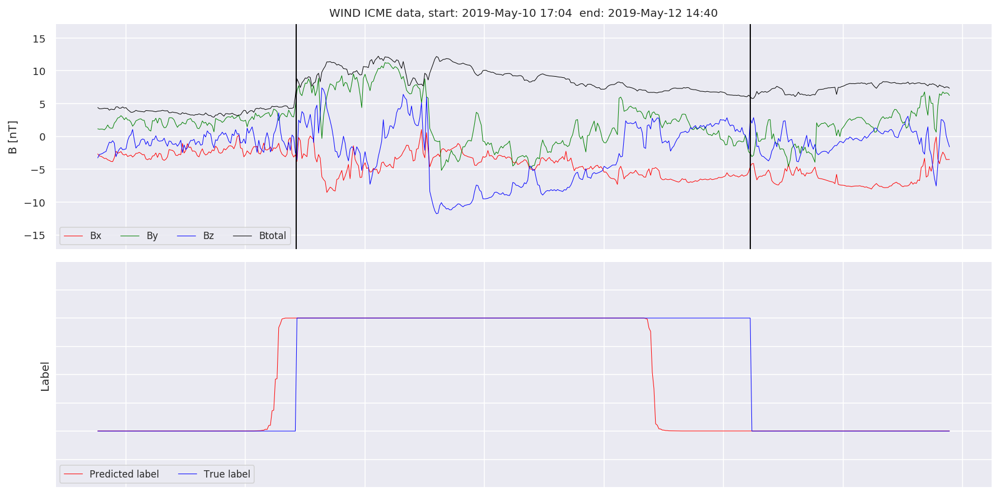

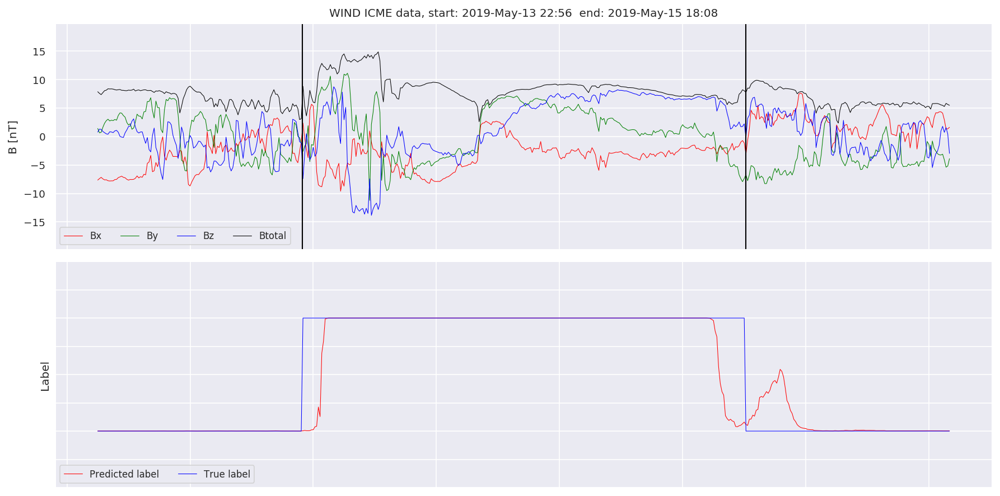

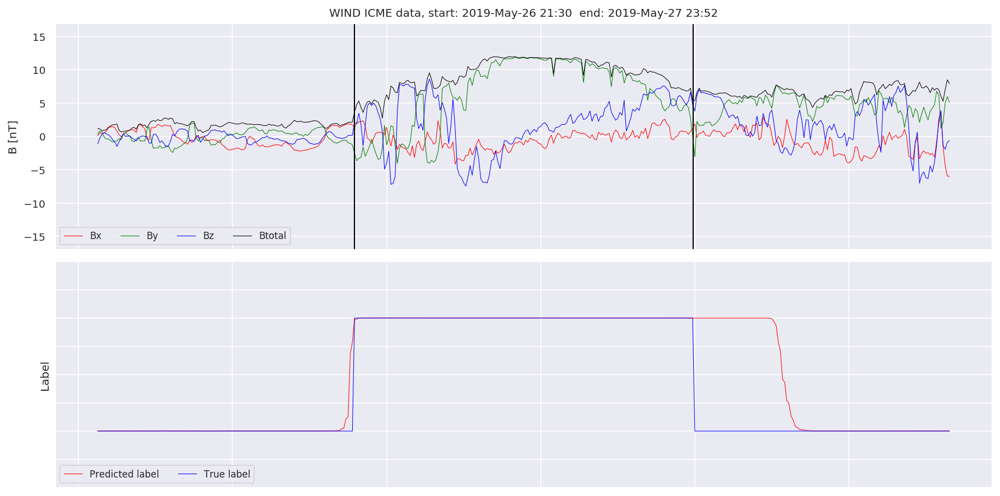

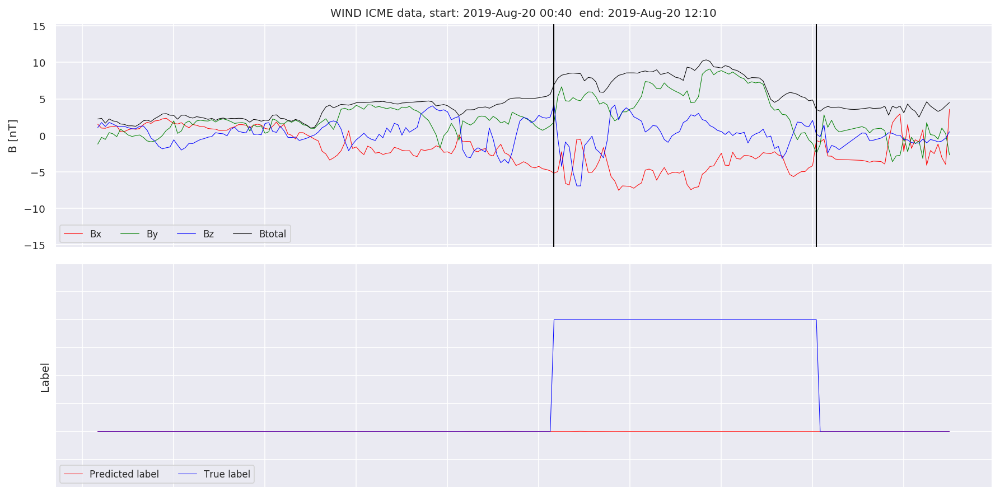

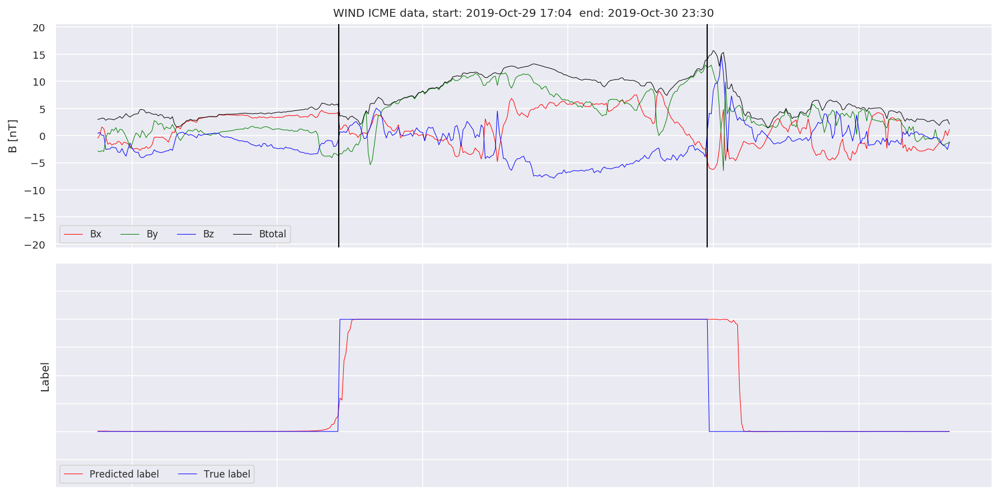

...

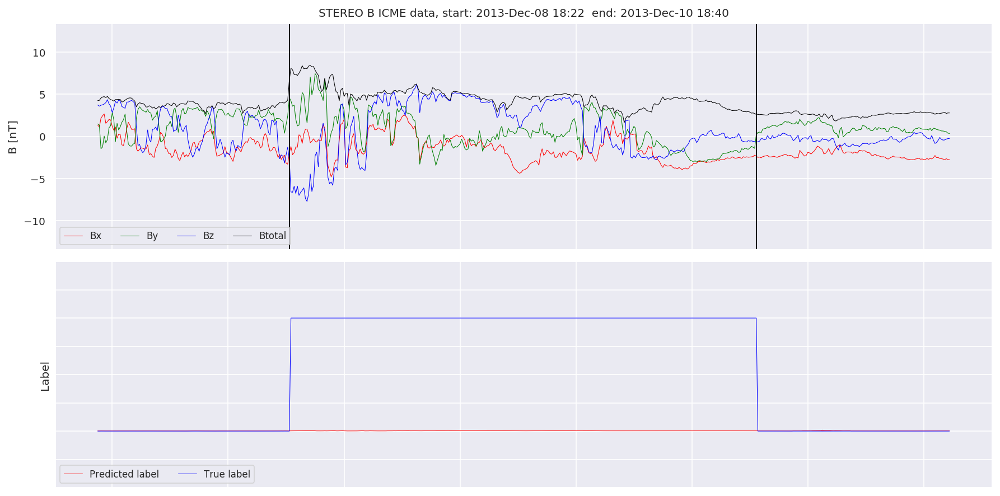

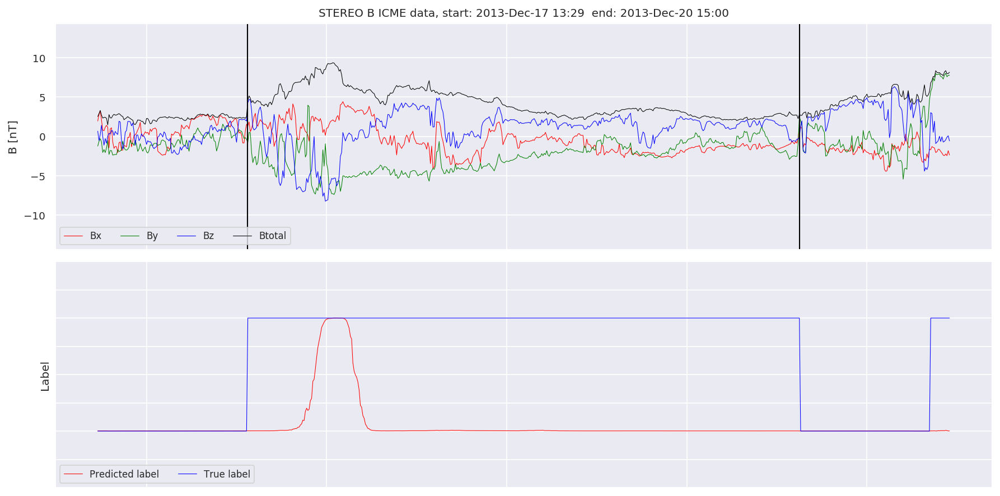

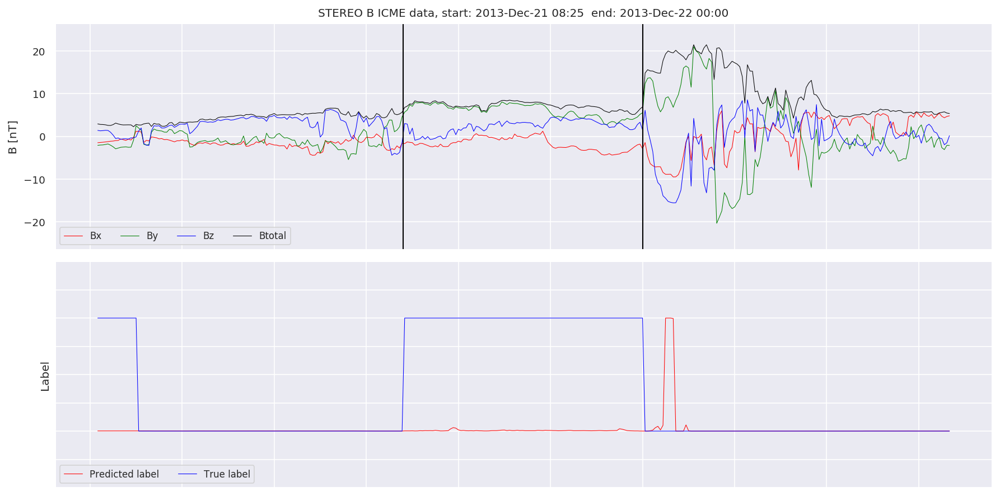

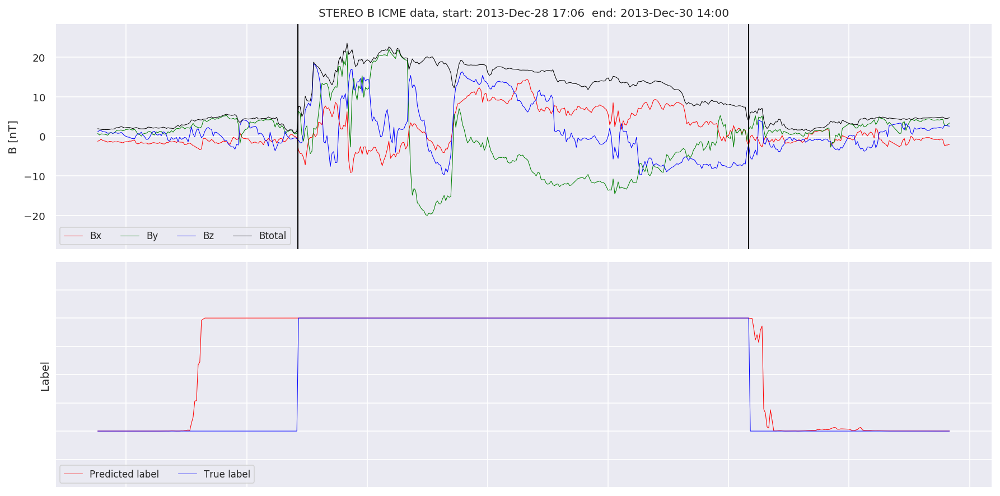

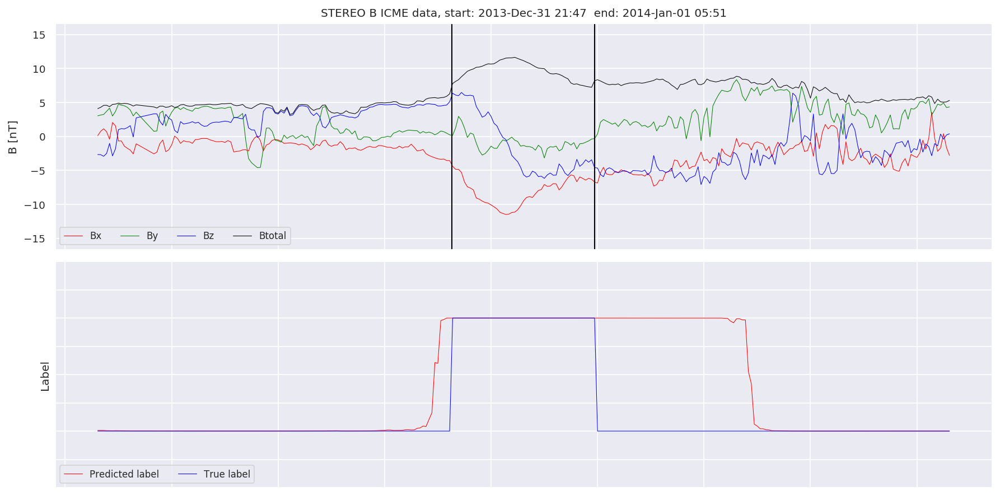

In [18]:
test_cloudsw = [x for x in evtListw if (x.begin>datetime.datetime(2019,1,1)) & (x.begin<datetime.datetime(2020,1,1))]

test_cloudsa = [x for x in evtLista if (x.begin>datetime.datetime(2019,1,1)) & (x.begin<datetime.datetime(2020,1,1))]

test_cloudsb = [x for x in evtListb if (x.begin>datetime.datetime(2013,1,1)) & (x.begin<datetime.datetime(2014,1,1))]

#Plot events and associated similarity values

for i in range(0, len(test_cloudsw)):
    test_cloudsw[i].plot_similarity(X_testw,20,i,'WIND ',resultw)
    
for i in range(0, len(test_cloudsa)):
    test_cloudsa[i].plot_similarity(X_testa,20,i,'STEREO A ',resulta)
    
for i in range(0, len(test_cloudsb)):
    test_cloudsb[i].plot_similarity(X_testb,20,i,'STEREO B ',resultb)

In [19]:
#postprocess WIND

resultw.index = pds.to_datetime(resultw.index)
resultwbin = postProcess.make_binary(resultw['pred'], 0.5)
eventsw = postProcess.makeEventList(resultwbin, 1, 10)
ICMEsw = postProcess.removeCreepy(eventsw, 2)

#postprocess STEREO A

resulta.index = pds.to_datetime(resulta.index)
resultabin = postProcess.make_binary(resulta['pred'], 0.5)
eventsa = postProcess.makeEventList(resultabin, 1, 10)
ICMEsa = postProcess.removeCreepy(eventsa, 2)

#postprocess STEREO B

resultb.index = pds.to_datetime(resultb.index)
resultbbin = postProcess.make_binary(resultb['pred'], 0.5)
eventsb = postProcess.makeEventList(resultbbin, 1, 10)
ICMEsb = postProcess.removeCreepy(eventsb, 2)


In [20]:
# Score by event WIND

import performance as prf

print('WIND:')

TPw, FNw, FPw, detectedw = prf.evaluate(ICMEsw, test_cloudsw, thres=0.1)
print('Precision is:',len(TPw)/(len(TPw)+len(FPw)))
print('Recall is:',len(TPw)/(len(TPw)+len(FNw)))
print('True Positives', len(TPw))
print('False Negatives', len(FNw))
print('False Positives', len(FPw))

# Score by event STEREO A

print('---------------------')

print('STEREO A:')

TPa, FNa, FPa, detecteda = prf.evaluate(ICMEsa, test_cloudsa, thres=0.1)
print('Precision is:',len(TPa)/(len(TPa)+len(FPa)))
print('Recall is:',len(TPa)/(len(TPa)+len(FNa)))
print('True Positives', len(TPa))
print('False Negatives', len(FNa))
print('False Positives', len(FPa))

# Score by event STEREO B

print('---------------------')

print('STEREO B:')

TPb, FNb, FPb, detectedb = prf.evaluate(ICMEsb, test_cloudsb, thres=0.1)
print('Precision is:',len(TPb)/(len(TPb)+len(FPb)))
print('Recall is:',len(TPb)/(len(TPb)+len(FNb)))
print('True Positives', len(TPb))
print('False Negatives', len(FNb))
print('False Positives', len(FPb))

WIND:
Precision is: 0.7142857142857143
Recall is: 0.8333333333333334
True Positives 5
False Negatives 1
False Positives 2
---------------------
STEREO A:
Precision is: 0.45454545454545453
Recall is: 0.38461538461538464
True Positives 5
False Negatives 8
False Positives 6
---------------------
STEREO B:
Precision is: 0.28
Recall is: 0.7241379310344828
True Positives 21
False Negatives 8
False Positives 54


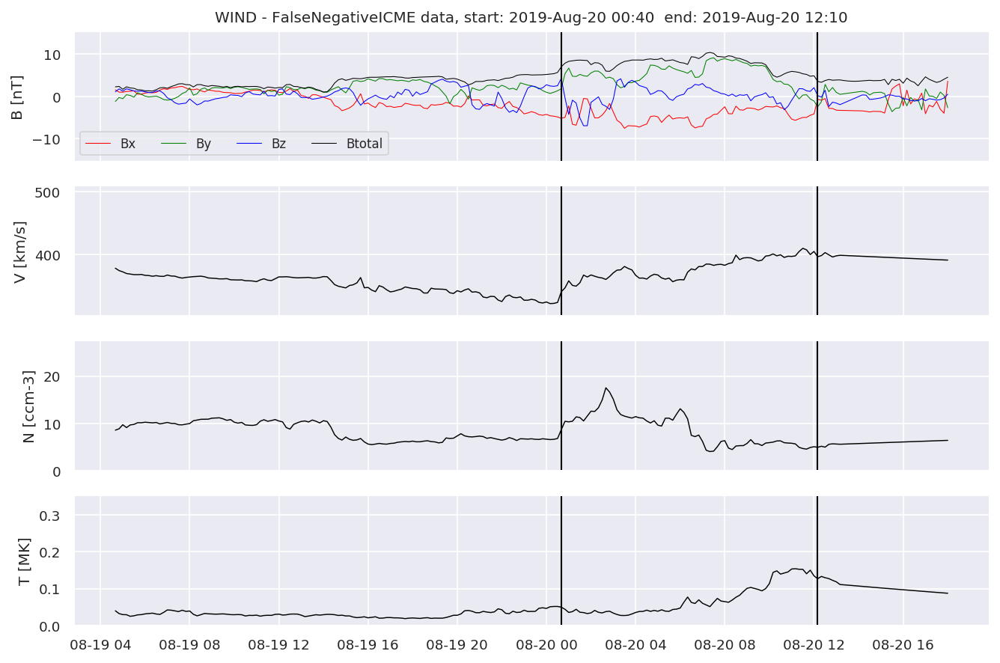

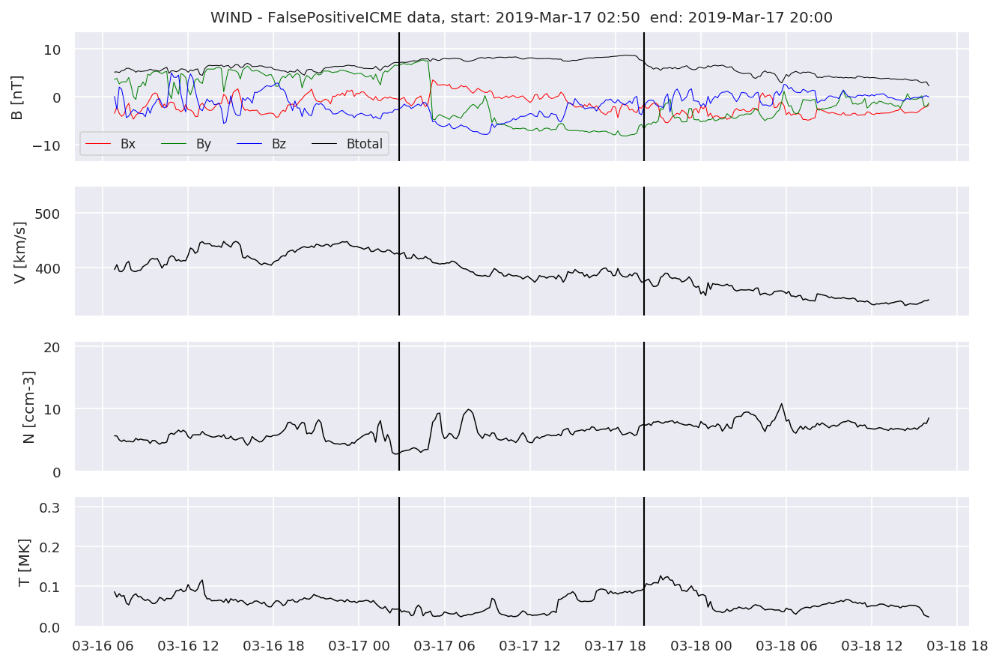

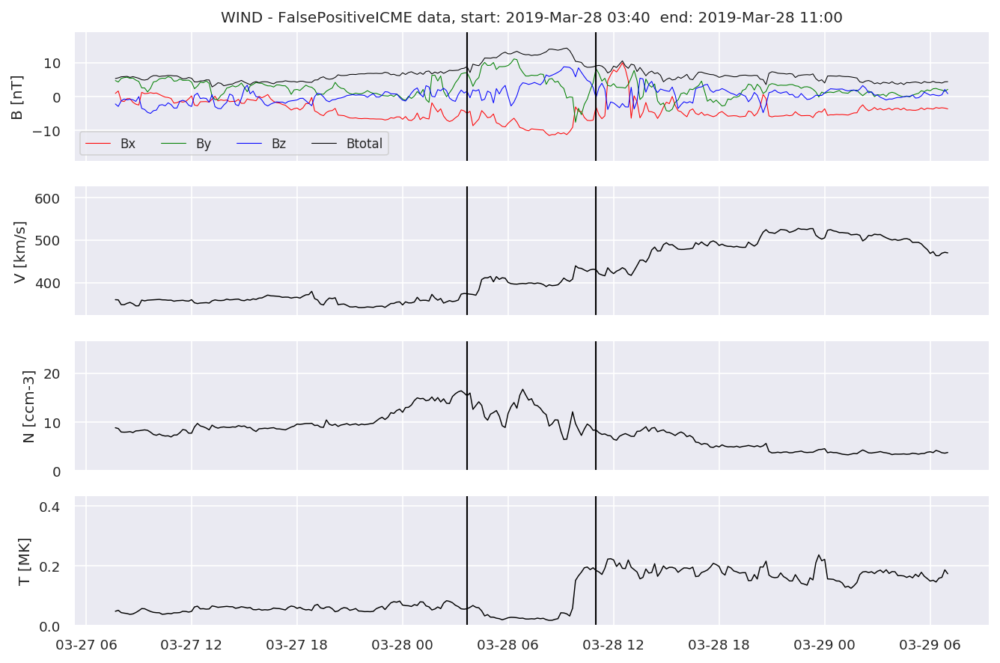

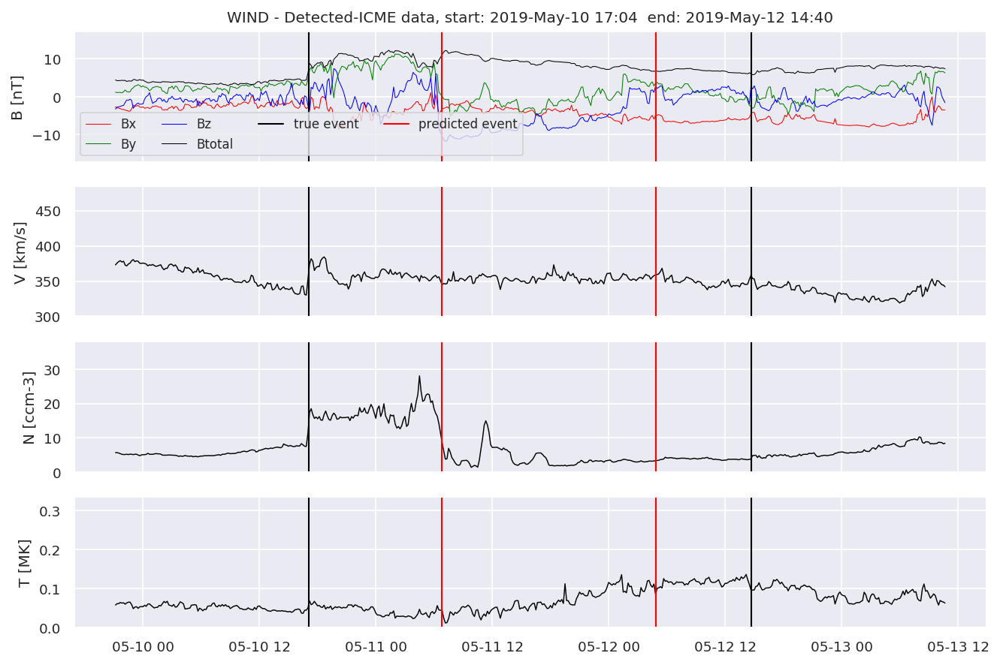

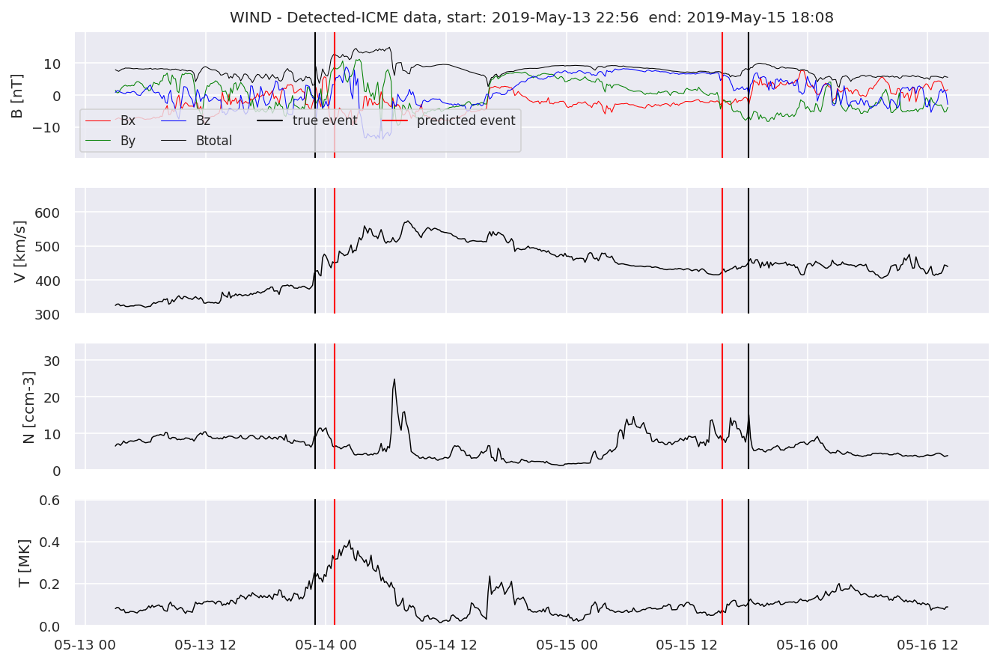

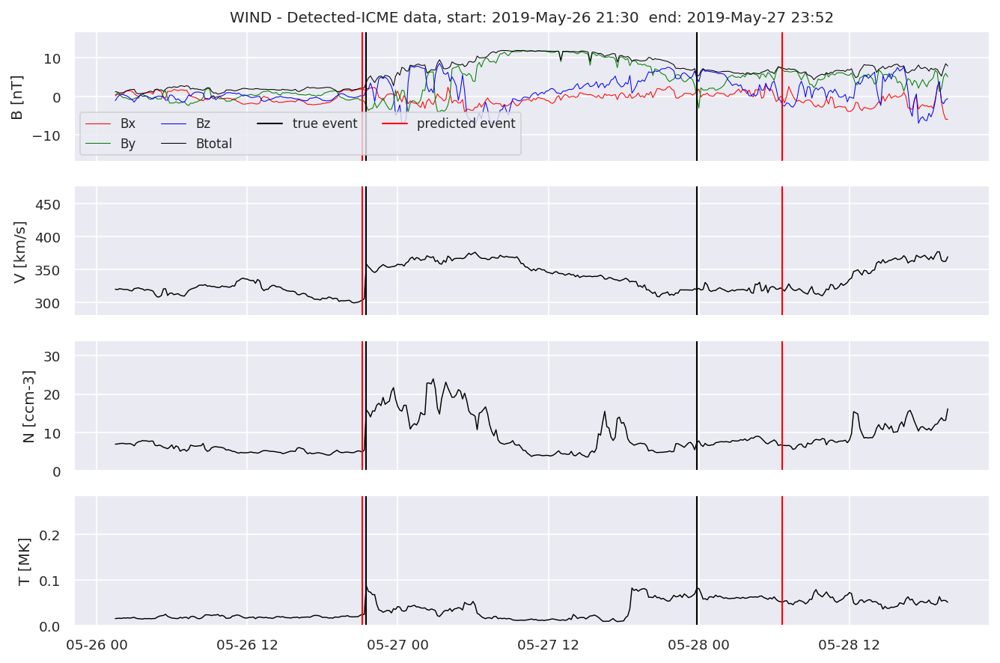

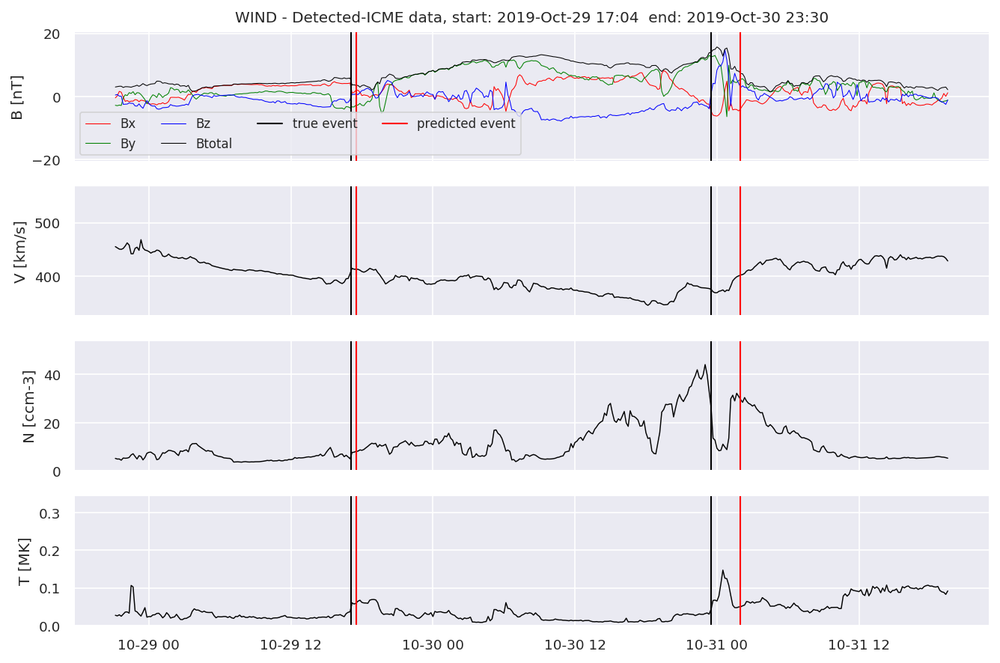

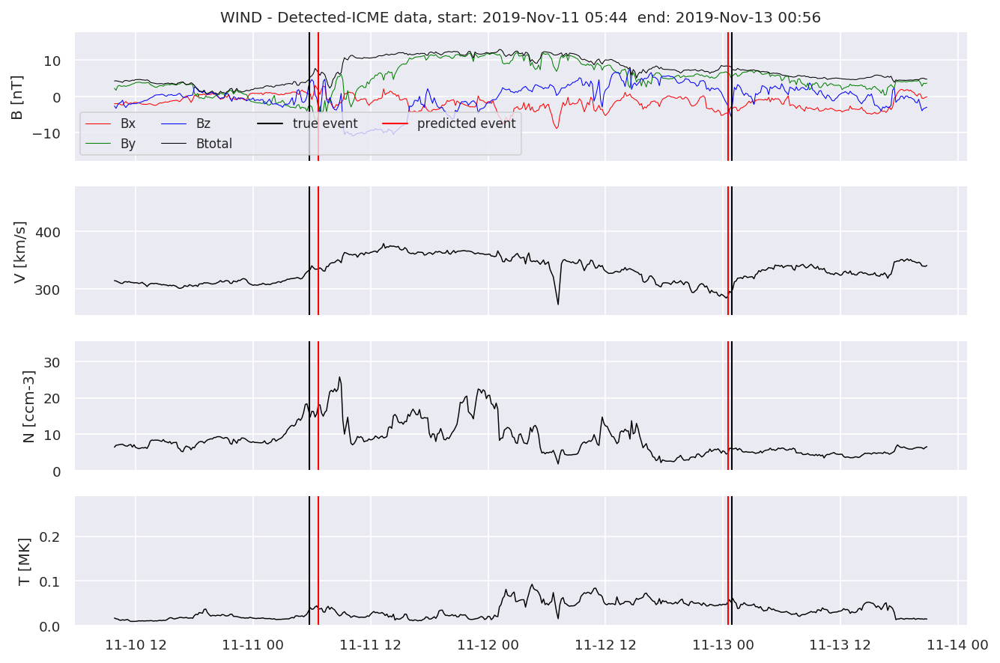

In [21]:
#Plot FNs, FPs and Detected events

for i in range(0, len(FNw)):
    
    FNw[i].iwfplotnopred(X_testw, 20, 'WIND - FalseNegative')
    
for i in range(0, len(FPw)):
    
    FPw[i].iwfplotnopred(X_testw, 20, 'WIND - FalsePositive')
    
    
for i in range(0, len(detectedw)):
    predstart = TPw[i].begin
    predend = TPw[i].end
    detectedw[i].iwfplot(X_testw, 20, i, 'WIND - Detected-', predstart, predend)

#for i in range(0, len(FNa)):
#    
#    FNa[i].iwfplotnopred(X_testa, 20, 'STEREO A - FalseNegative')
    
#for i in range(0, len(FPa)):
    
#    FPa[i].iwfplotnopred(X_testa, 20, 'STEREO A - FalsePositive')
    
    
#for i in range(0, len(detecteda)):
#    predstart = TPa[i].begin
#    predend = TPa[i].end
#    detecteda[i].iwfplot(X_testa, 20, i, 'STEREO A - Detected-', predstart, predend)

#for i in range(0, len(FNb)):
#    
#    FNb[i].iwfplotnopred(X_testb, 20, 'STEREO B - FalseNegative')
    
#for i in range(0, len(FPb)):
#    
#    FPb[i].iwfplotnopred(X_testb, 20, 'STEREO B - FalsePositive')
    
    
#for i in range(0, len(detectedb)):
#    predstart = TPb[i].begin
#    predend = TPb[i].end
#    detectedb[i].iwfplot(X_testb, 20, i, 'STEREO B - Detected-', predstart, predend)

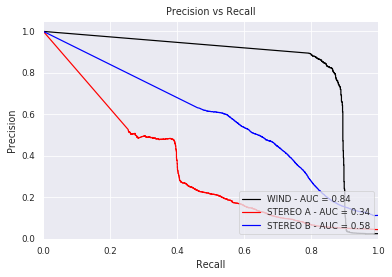

In [22]:
from sklearn.metrics import precision_recall_curve, auc, plot_precision_recall_curve


# calculate precision-recall curve
precisionw, recallw, thresholdsw = precision_recall_curve(resultw['true'], resultw['pred'])
pr_aucw = auc(recallw, precisionw)

precisiona, recalla, thresholdsa = precision_recall_curve(resulta['true'], resulta['pred'])
pr_auca = auc(recalla, precisiona)

precisionb, recallb, thresholdsb = precision_recall_curve(resultb['true'], resultb['pred'])
pr_aucb = auc(recallb, precisionb)

plt.figure()
plt.title('Precision vs Recall')
plt.plot(recallw, precisionw, 'k', label = 'WIND - AUC = %0.2f' % pr_aucw)
plt.plot(recalla, precisiona, 'r', label = 'STEREO A - AUC = %0.2f' % pr_auca)
plt.plot(recallb, precisionb, 'b', label = 'STEREO B - AUC = %0.2f' % pr_aucb)
plt.legend(loc = 'lower right')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.show()   

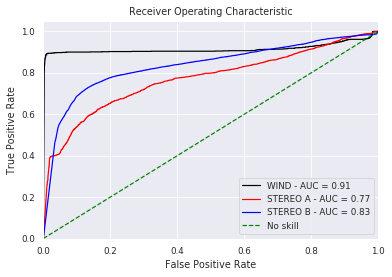

In [23]:
from sklearn.metrics import roc_curve, roc_auc_score

# calculate roc curve

fprw, tprw, thresholdsw = roc_curve(resultw['true'], resultw['pred'])
fpra, tpra, thresholdsa = roc_curve(resulta['true'], resulta['pred'])
fprb, tprb, thresholdsb = roc_curve(resultb['true'], resultb['pred'])

auc_rocw = roc_auc_score(resultw['true'], resultw['pred'])
auc_roca = roc_auc_score(resulta['true'], resulta['pred'])
auc_rocb = roc_auc_score(resultb['true'], resultb['pred'])


plt.title('Receiver Operating Characteristic')
plt.plot(fprw, tprw, 'k', label = 'WIND - AUC = %0.2f' % auc_rocw)
plt.plot(fpra, tpra, 'r', label = 'STEREO A - AUC = %0.2f' % auc_roca)
plt.plot(fprb, tprb, 'b', label = 'STEREO B - AUC = %0.2f' % auc_rocb)
plt.plot([0, 1], [0, 1],'g--',label = 'No skill')
plt.legend(loc = 'lower right')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()  